<a href="https://colab.research.google.com/github/SSRangari/Exploratory_Data_Analysis_project/blob/main/life_exp-dimention%20and%20clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Explanation on life dataset:


+ Country - Country Observed.
+ Year - Year Observed.
+ Status - Developed or Developing status.
+ Life.expectancy - Life Expectancy in age.
+ Adult.Mortality - Adult Mortality Rates on both sexes (probability of dying between 15-60 years/1000 population).
+ infant.deaths - Number of Infant Deaths per 1000 population.
+ Alcohol - Alcohol recorded per capita (15+) consumption (in litres of pure alcohol).
+ percentage.expenditure - Expenditure on health as a percentage of Gross Domestic Product per capita(%).
+ Hepatitis.B - Hepatitis B (HepB) immunization coverage among 1-year-olds (%).
+ Measles - Number of reported Measles cases per 1000 population.
+ BMI - Average Body Mass Index of entire population.
+ under.five.deaths - Number of under-five deaths per 1000 population.
+ Polio - Polio (Pol3) immunization coverage among 1-year-olds (%).
+ Total expenditure - General government expenditure on health as a percentage of total government expenditure (%).
+ Diphtheria - Diphtheria tetanus toxoid and pertussis (DTP3) immunization coverage among 1-year-olds (%).
+ HIV_AIDS - Deaths per 1 000 live births HIV/AIDS (0-4 years).
+ GDP - Gross Domestic Product per capita (in USD).
+ Population - Population of the country.
+ thinness.1-19 years - Prevalence of thinness among children and adolescents for Age 10 to 19 (%).
+ thinness 5-9 years - Prevalence of thinness among children for Age 5 to 9(%).
+ Income.composition.of.resources - Human Development Index in terms of income composition of resources (index ranging from 0 to 1).
+ Schooling - Number of years of Schooling(years) .

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
%matplotlib inline

from scipy.stats import zscore

pd.set_option("display.max_rows",None)
pd.set_option("display.max_columns",None)

from sklearn.preprocessing import StandardScaler

In [2]:
##let's read csv file and show the file of data
def read_show():
    global data
    data=pd.read_csv(input("Enter the URL"))
    # read the csv file in jupyter notebook
    return data.head()# return 5 row of dataset

In [3]:
read_show()

Enter the URL/content/Life Expectancy Data.csv


,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [4]:
def data_understand(data):
    print("\n","Name of the columns",data.columns)
    #lets check out the name of collumns
    print("\n","size of the detaset",data.shape)
      #lets check out the no. of size of detaset
    print("\n","understaning the detaset information",data.info())
      # understanding info
    return data.isnull().sum()
       # lets check missing values in dataset

In [5]:
data_understand(data)


 Name of the columns Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

 size of the detaset (2938, 22)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

In [6]:
#Exploring dataset to findout which type of missing values are present
data.loc[7:1000]

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
7,Afghanistan,2008,Developing,58.1,287.0,80,0.03,25.873925,64.0,1599,15.7,110,64.0,8.33,64.0,0.1,373.361116,2729431.0,18.8,18.9,0.433,8.7
8,Afghanistan,2007,Developing,57.5,295.0,82,0.02,10.910156,63.0,1141,15.2,113,63.0,6.73,63.0,0.1,369.835796,26616792.0,19.0,19.1,0.415,8.4
9,Afghanistan,2006,Developing,57.3,295.0,84,0.03,17.171518,64.0,1990,14.7,116,58.0,7.43,58.0,0.1,272.563770,2589345.0,19.2,19.3,0.405,8.1
10,Afghanistan,2005,Developing,57.3,291.0,85,0.02,1.388648,66.0,1296,14.2,118,58.0,8.70,58.0,0.1,25.294130,257798.0,19.3,19.5,0.396,7.9
11,Afghanistan,2004,Developing,57.0,293.0,87,0.02,15.296066,67.0,466,13.8,120,5.0,8.79,5.0,0.1,219.141353,24118979.0,19.5,19.7,0.381,6.8
12,Afghanistan,2003,Developing,56.7,295.0,87,0.01,11.089053,65.0,798,13.4,122,41.0,8.82,41.0,0.1,198.728544,2364851.0,19.7,19.9,0.373,6.5
13,Afghanistan,2002,Developing,56.2,3.0,88,0.01,16.887351,64.0,2486,13.0,122,36.0,7.76,36.0,0.1,187.845950,21979923.0,19.9,2.2,0.341,6.2
14,Afghanistan,2001,Developing,55.3,316.0,88,0.01,10.574728,63.0,8762,12.6,122,35.0,7.80,33.0,0.1,117.496980,2966463.0,2.1,2.4,0.340,5.9
15,Afghanistan,2000,Developing,54.8,321.0,88,0.01,10.424960,62.0,6532,12.2,122,24.0,8.20,24.0,0.1,114.560000,293756.0,2.3,2.5,0.338,5.5
16,Albania,2015,Developing,77.8,74.0,0,4.60,364.975229,99.0,0,58.0,0,99.0,6.00,99.0,0.1,3954.227830,28873.0,1.2,1.3,0.762,14.2


In [7]:
#copy orignal data into anathor name
import copy
df_copy=copy.deepcopy(data)

In [8]:
#finding which type of unique values have present

df_copy['Country'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', "Côte d'Ivoire", 'Cabo Verde',
       'Cambodia', 'Cameroon', 'Canada', 'Central African Republic',
       'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo',
       'Cook Islands', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus',
       'Czechia', "Democratic People's Republic of Korea",
       'Democratic Republic of the Congo', 'Denmark', 'Djibouti',
       'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia',
       'Georgia', 'Germany'

In [9]:
df_copy['Status'].unique()

array(['Developing', 'Developed'], dtype=object)

In [10]:
## country feature are drop becouse of loats of uniqe values
df_copy=df_copy.drop('Country',axis=1)

In [11]:
# converts charecters into numerical 
from sklearn.preprocessing import LabelEncoder

df_copy.loc[:,['Status']] = df_copy.loc[:,['Status']].apply(LabelEncoder().fit_transform) 

In [12]:
df_copy.head()

,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,2015,1,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,2014,1,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,2013,1,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,2012,1,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,2011,1,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [13]:
from sklearn.model_selection import train_test_split

In [14]:
data_train, data_test = train_test_split(df_copy, test_size = 0.3, random_state = 7)

In [15]:
#let's do imputation
def imputation(data_train):
    
    global df_impute
    
    from sklearn.impute import SimpleImputer
    
    df_impute = copy.deepcopy(data_train)
    
    impute_strategy = SimpleImputer(strategy = 'mean')
    #imputation using mean strategy
    df_impute= impute_strategy.fit_transform(df_impute)
    #convert ndarray into dataFrame
    df_impute = pd.DataFrame(df_impute)
    # add column name
    df_impute.columns = df_copy.columns

In [16]:
imputation(data_train)

In [17]:
df_impute.isnull().sum()

Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
 BMI                               0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
 HIV/AIDS                          0
GDP                                0
Population                         0
 thinness  1-19 years              0
 thinness 5-9 years                0
Income composition of resources    0
Schooling                          0
dtype: int64

In [18]:
# go for discriptive statestics
df_impute.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Year,2056.0,2.007515e+03,4.619622e+00,2000.000000,2003.000000,2.008000e+03,2.012000e+03,2.015000e+03
Status,2056.0,8.253891e-01,3.797263e-01,0.000000,1.000000,1.000000e+00,1.000000e+00,1.000000e+00
Life expectancy,2056.0,6.927314e+01,9.432919e+00,39.000000,63.200000,7.210000e+01,7.550000e+01,8.900000e+01
Adult Mortality,2056.0,1.663237e+02,1.243750e+02,1.000000,76.000000,1.450000e+02,2.282500e+02,7.170000e+02
infant deaths,2056.0,3.020866e+01,1.190199e+02,0.000000,0.000000,3.000000e+00,2.200000e+01,1.800000e+03
Alcohol,2056.0,4.597242e+00,3.939727e+00,0.010000,1.030000,4.125000e+00,7.437500e+00,1.787000e+01
percentage expenditure,2056.0,7.349948e+02,1.987069e+03,0.000000,5.049462,6.381745e+01,4.433624e+02,1.909905e+04
Hepatitis B,2056.0,8.105462e+01,2.248659e+01,1.000000,81.054622,8.700000e+01,9.600000e+01,9.900000e+01
Measles,2056.0,2.683531e+03,1.260959e+04,0.000000,0.000000,1.800000e+01,3.875000e+02,2.121830e+05
BMI,2056.0,3.821179e+01,2.011873e+01,1.000000,19.400000,4.305000e+01,5.620000e+01,8.730000e+01


In [19]:
# working on outlier
df_impute.skew()

Year                               -0.008988
Status                             -1.715477
Life expectancy                    -0.641916
Adult Mortality                     1.194732
infant deaths                       9.878669
Alcohol                             0.613549
percentage expenditure              4.608750
Hepatitis B                        -2.185587
Measles                             8.927248
 BMI                               -0.223306
under-five deaths                   9.674472
Polio                              -2.148678
Total expenditure                   0.660760
Diphtheria                         -2.113119
 HIV/AIDS                           5.353243
GDP                                 3.545010
Population                         18.246290
 thinness  1-19 years               1.702199
 thinness 5-9 years                 1.764351
Income composition of resources    -1.182218
Schooling                          -0.605674
dtype: float64

In [20]:
df_impute.kurtosis()

Year                                -1.214901
Status                               0.943780
Life expectancy                     -0.203987
Adult Mortality                      1.863497
infant deaths                      118.277524
Alcohol                             -0.638649
percentage expenditure              25.771269
Hepatitis B                          4.319716
Measles                            101.166422
 BMI                                -1.293297
under-five deaths                  113.899819
Polio                                4.093306
Total expenditure                    1.603256
Diphtheria                           3.758171
 HIV/AIDS                           34.271164
GDP                                 16.001522
Population                         377.023426
 thinness  1-19 years                3.960952
 thinness 5-9 years                  4.306652
Income composition of resources      1.670402
Schooling                            1.113595
dtype: float64

# kurtosis present in dataset

In [21]:
# finding outlier using box-plot technique
for i in df_impute.columns:
    fig = px.box(df_impute, y=i, width=600, height=400, title=i , template="plotly_dark")
    fig.show()

In [22]:
# Treatment on extream values using zscore
def multi_tretment_outlier(df_impute):   
    global data_z
    print("List of outliers")
    data_z= df_impute.apply(zscore) # find outlier using zscore 
    print(np.where(data_z > 3))
    feature_columns = df_impute.columns

    for i in feature_columns:   #tretment of outliers
        df_impute[i] = np.where(df_impute[i] > (df_impute[i].quantile(0.75) + (df_impute[i].quantile(0.75) - df_impute[i].quantile(0.25))*1.5),
                           (df_impute[i].quantile(0.75) + (df_impute[i].quantile(0.75) - df_impute[i].quantile(0.25))*1.5),
                          np.where(df_impute[i] < (df_impute[i].quantile(0.25) - (df_impute[i].quantile(0.75) - df_impute[i].quantile(0.25))*1.5),
                           (df_impute[i].quantile(0.25) - (df_impute[i].quantile(0.75) - df_impute[i].quantile(0.25))*1.5),df_impute[i]))
    for i in feature_columns:
        fig = px.box(df_impute , y= i, width=600, height=400, title=i, template="plotly_dark") 

        fig.show() 
    global data_z_1
    print(" Resolve outliers") 
    data_z_1= df_impute.apply(zscore)
    print(np.where(data_z_1 > 18)) ## treatment on extream value using z_score


In [23]:
multi_tretment_outlier(df_impute)

List of outliers
(array([  12,   12,   35,   35,   40,   40,   40,   41,   44,   44,   86,
         88,   95,   95,  102,  118,  129,  129,  144,  144,  150,  150,
        160,  160,  163,  163,  165,  176,  176,  179,  179,  185,  187,
        187,  193,  194,  194,  194,  194,  194,  197,  202,  202,  205,
        213,  222,  231,  234,  234,  240,  243,  249,  260,  265,  268,
        277,  280,  298,  308,  308,  314,  314,  318,  318,  322,  331,
        331,  336,  345,  345,  358,  358,  359,  376,  377,  379,  379,
        390,  390,  392,  392,  393,  393,  409,  420,  426,  426,  428,
        434,  434,  444,  452,  455,  465,  465,  465,  465,  465,  465,
        468,  468,  477,  477,  478,  478,  478,  483,  483,  484,  484,
        487,  489,  489,  492,  492,  495,  510,  524,  527,  527,  529,
        529,  529,  529,  534,  554,  554,  588,  589,  589,  589,  600,
        607,  617,  617,  636,  638,  638,  646,  646,  647,  648,  658,
        658,  672,  672,  676,  6

 Resolve outliers
(array([], dtype=int64), array([], dtype=int64))


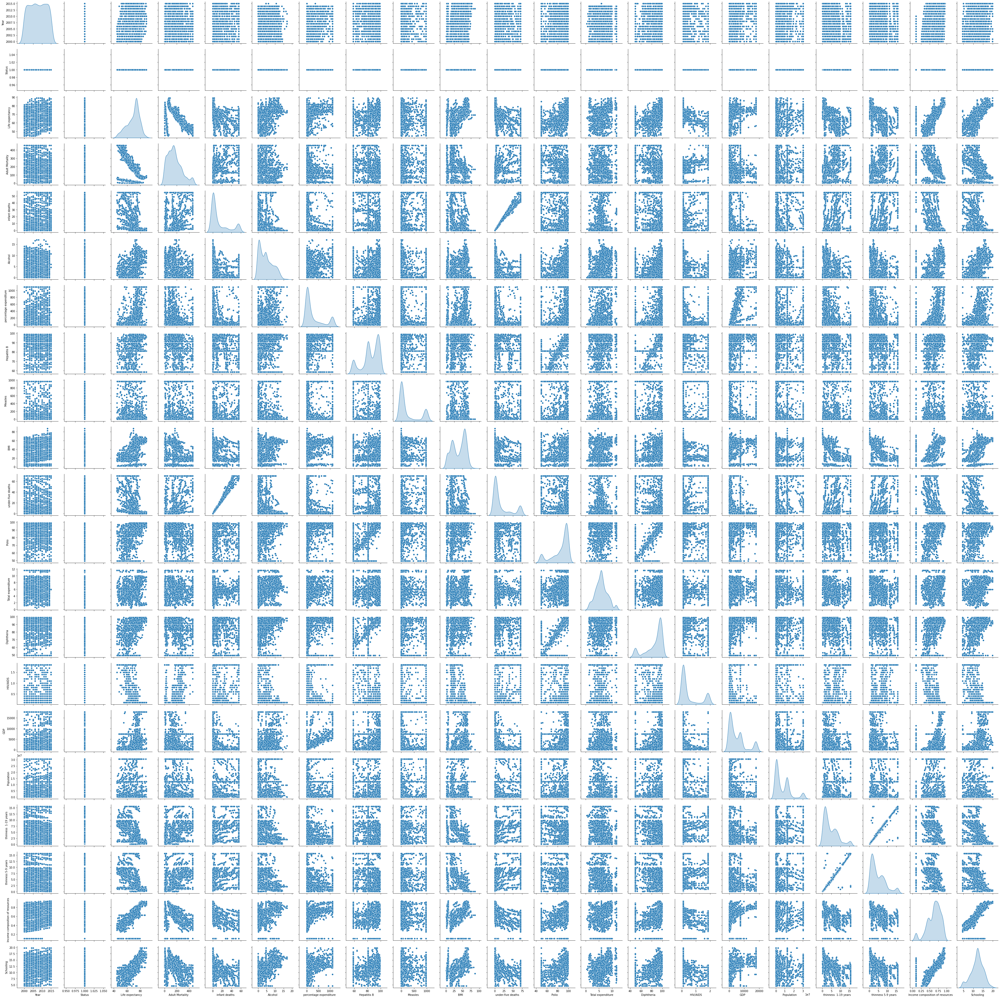

In [24]:
sns.pairplot(df_impute, diag_kind = "kde")

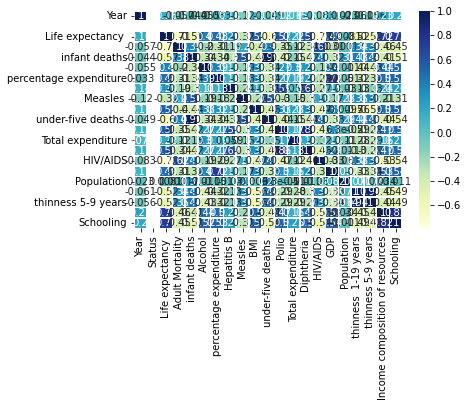

In [25]:
sns.heatmap(df_impute.corr(method = "pearson"), annot = True, cmap="YlGnBu", linewidths=.5)

In [26]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler

In [27]:
#scale dataset using MinMaxScaler method
scale_1 = MinMaxScaler()
train_scale = scale_1.fit_transform(df_impute)

In [28]:
train_scale[:5]

array([[0.46666667, 0.        , 0.69265537, 0.26995885, 0.01818182,
        0.39087374, 0.01314738, 0.87612554, 0.        , 0.6778679 ,
        0.01428571, 0.8989899 , 0.69773635, 0.8989899 , 0.        ,
        0.00421493, 0.10965966, 0.09677419, 0.08995984, 0.77787624,
        0.70394737],
       [0.86666667, 0.        , 0.50282486, 0.71111111, 1.        ,
        0.        , 0.08244806, 0.47972727, 1.        , 0.19235226,
        1.        , 0.65656566, 0.63027075, 0.57575758, 1.        ,
        0.03693082, 1.        , 0.36129032, 0.35983936, 0.44469059,
        0.35526316],
       [0.06666667, 0.        , 0.67683616, 0.03950617, 0.        ,
        0.02699729, 0.97986129, 1.        , 0.01135484, 0.30127462,
        0.        , 1.        , 0.28672881, 0.95959596, 0.        ,
        0.92419943, 0.40873974, 0.43225806, 0.39196787, 0.84758529,
        0.57894737],
       [0.8       , 0.        , 0.32655367, 0.76378601, 0.52727273,
        0.15141956, 0.1788786 , 0.47972727, 0.9249032

In [29]:
from sklearn.decomposition import NMF

In [30]:
# Reduce dimention using dimention technique
def dim_fn(train_scale, method):
    global train_dim
        
        
    reduce = method
    train_dim = reduce.fit_transform(train_scale)
    
    
    var_train = np.var(train_dim, axis = 0)
    var_train_ratio = var_train / np.sum(var_train)
    
    
    
    print("varance ratio for train : ", var_train_ratio)

    

    
    return

In [31]:
dim_fn(train_scale, NMF(n_components = 6))

varance ratio for train :  [0.15496359 0.28040745 0.15380878 0.17016006 0.1221718  0.11848832]


/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:289: FutureWarning:

The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).

/usr/local/lib/python3.8/dist-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning:

Maximum number of iterations 200 reached. Increase it to improve convergence.



In [32]:
### Incremental PCA

from sklearn.decomposition import IncrementalPCA

In [33]:
n_batches = 3

pca_incremental = IncrementalPCA(n_components = 2)

for batch in np.array_split(train_scale, n_batches):
    pca_incremental.partial_fit(batch)
    
x_train_ipca = pca_incremental.transform(train_scale)



In [34]:
var_train_ipca = np.var(train_scale, axis = 0)

var_train_ratio_ipca = var_train_ipca / np.sum(var_train_ipca)

print(var_train_ratio_ipca)

[0.05460711 0.         0.02601837 0.03680445 0.0688002  0.03075376
 0.072306   0.05616925 0.08931504 0.03128947 0.07436526 0.05703709
 0.02340353 0.05729363 0.08969457 0.05645016 0.0469802  0.03766205
 0.03803481 0.02955683 0.02345822]


In [35]:
from sklearn.decomposition import FactorAnalysis

In [36]:
dim_fn(train_scale, FactorAnalysis(n_components = 4))

varance ratio for train :  [0.26660486 0.25863315 0.24954641 0.22521558]


# clustering

In [37]:
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

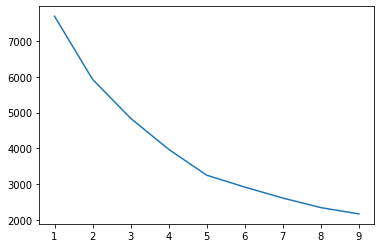

In [38]:
# doing clustering use KMeans clustering method ilbo_method
wss = []

for i in range(1,10):
    KM = KMeans(n_clusters = i)
    KM.fit(train_dim)
    wss.append(KM.inertia_)

plt.plot(range(1,10), wss)

In [39]:
# clustering using silhouett score
for i in range(2,10):
    k_means = KMeans(n_clusters = i, random_state = 15)
    k_means.fit(train_dim)
    labels = k_means.labels_
    print("Silhouette Score for ", i, " Clusters Solutions : ", silhouette_score(train_dim, labels))

Silhouette Score for  2  Clusters Solutions :  0.3525276680055725
Silhouette Score for  3  Clusters Solutions :  0.34363134435725873
Silhouette Score for  4  Clusters Solutions :  0.3618943520217012
Silhouette Score for  5  Clusters Solutions :  0.34186403325631676
Silhouette Score for  6  Clusters Solutions :  0.3334154632226882
Silhouette Score for  7  Clusters Solutions :  0.2703730769434676
Silhouette Score for  8  Clusters Solutions :  0.29067703893082303
Silhouette Score for  9  Clusters Solutions :  0.3067646363320497


#cluster 4 gives good score 

In [40]:
k_means_final = KMeans(n_clusters = 4, random_state = 98)
k_means_final.fit(train_dim)
labels_4 = k_means_final.labels_

In [41]:
labels_4[:5]

array([2, 1, 3, 1, 2], dtype=int32)

In [42]:
train_cluster_kmeans = copy.deepcopy(df_impute)

train_cluster_kmeans['Label'] = labels_4

In [43]:
train_cluster_kmeans.head()

,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Label
0,2007.0,1.0,75.4,124.0,1.0,6.67,14.473059,94.000000,0.00,59.5,1.0,94.0,8.23,94.0,0.10,79.697460,3.339741e+06,1.6,1.5,0.760,15.3,2
1,2013.0,1.0,67.0,325.0,55.0,0.01,90.761444,78.000000,968.75,17.6,70.0,82.0,7.47,78.0,1.85,662.492293,3.045523e+07,5.7,5.7,0.478,10.0,1
2,2001.0,1.0,74.7,19.0,0.0,0.47,1078.662440,99.000000,11.00,27.0,0.0,99.0,3.60,97.0,0.10,16468.128860,1.244828e+07,6.8,6.2,0.819,13.4,3
3,2012.0,1.0,59.2,349.0,29.0,2.59,196.915250,78.000000,896.00,21.7,43.0,49.5,4.91,78.0,1.85,1734.936120,1.469994e+07,6.5,6.3,0.554,12.3,1
4,2001.0,1.0,73.1,135.0,1.0,7.53,222.506571,81.054622,35.00,51.7,1.0,93.0,6.89,93.0,0.10,1634.875610,7.534330e+05,2.8,2.8,0.709,13.1,2


In [44]:
train_cluster_kmeans.groupby('Label').mean()

,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Label,,,,,,,,,,,,,,,,,,,,,
0,2006.378788,1.0,64.309179,193.961927,9.094697,3.368076,161.820181,72.001393,257.295455,34.500513,13.015152,62.634470,5.118718,59.143939,0.853598,3194.491192,4.700719e+06,4.923328,4.944919,0.517184,10.310334
1,2007.176471,1.0,60.213636,236.909091,49.879679,2.442614,92.099388,78.099751,650.252674,22.966217,65.681818,74.214218,5.251389,74.296535,1.020187,2442.523326,1.230904e+07,7.454118,7.656804,0.507151,9.540381
2,2007.748293,1.0,75.454432,111.106629,3.218537,6.424096,424.444779,88.677950,118.860976,49.489073,3.836098,93.449124,6.530166,93.951914,0.163415,7283.897956,7.248440e+06,2.175610,2.137854,0.737569,13.877165
3,2007.989822,1.0,65.156361,209.033079,9.195929,2.705950,181.098992,89.339454,218.764631,25.800629,12.755725,90.378460,5.408154,91.019868,0.834097,3302.517359,5.433036e+06,8.657790,8.685706,0.550432,10.864721


In [45]:
k_means_3 = KMeans(n_clusters = 4, random_state = 98)
k_means_3.fit(train_dim)
labels_3 = k_means_3.labels_

train_cluster_kmeans['Label_3'] = labels_3

train_cluster_kmeans.groupby('Label_3').mean()

,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Label
Label_3,,,,,,,,,,,,,,,,,,,,,,
0,2006.378788,1.0,64.309179,193.961927,9.094697,3.368076,161.820181,72.001393,257.295455,34.500513,13.015152,62.634470,5.118718,59.143939,0.853598,3194.491192,4.700719e+06,4.923328,4.944919,0.517184,10.310334,0.0
1,2007.176471,1.0,60.213636,236.909091,49.879679,2.442614,92.099388,78.099751,650.252674,22.966217,65.681818,74.214218,5.251389,74.296535,1.020187,2442.523326,1.230904e+07,7.454118,7.656804,0.507151,9.540381,1.0
2,2007.748293,1.0,75.454432,111.106629,3.218537,6.424096,424.444779,88.677950,118.860976,49.489073,3.836098,93.449124,6.530166,93.951914,0.163415,7283.897956,7.248440e+06,2.175610,2.137854,0.737569,13.877165,2.0
3,2007.989822,1.0,65.156361,209.033079,9.195929,2.705950,181.098992,89.339454,218.764631,25.800629,12.755725,90.378460,5.408154,91.019868,0.834097,3302.517359,5.433036e+06,8.657790,8.685706,0.550432,10.864721,3.0


# DBSCANE

In [46]:
from sklearn.cluster import DBSCAN 

from sklearn.neighbors import NearestNeighbors

In [47]:
neigh = NearestNeighbors(n_neighbors=3)
nbrs = neigh.fit(train_dim)
distances, indices = nbrs.kneighbors(train_dim)

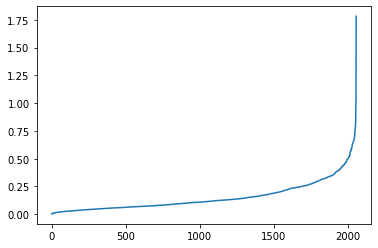

In [48]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [49]:
for i in range(5, 20):
    eps = i / 100
    dbscan = DBSCAN(eps = eps)
    model = dbscan.fit(train_dim)
    labels = model.labels_
    print(eps, '\t', silhouette_score(train_dim, labels))

0.05 	 -0.3418958850479249
0.06 	 -0.41166526658432373
0.07 	 -0.4063073738947154
0.08 	 -0.4096986179638355
0.09 	 -0.3713840872827356
0.1 	 -0.35640112921060507
0.11 	 -0.3683445245262564
0.12 	 -0.4425931651835797
0.13 	 -0.4226972686967143
0.14 	 -0.41441588667848395
0.15 	 -0.3885132279392672
0.16 	 -0.4163123316042151
0.17 	 -0.3456974109362059
0.18 	 -0.3656272235134076
0.19 	 -0.36069548925316625


## 0.12 show the best eps silhouette score

In [50]:
dbscan = DBSCAN(eps = 0.12)

final_dbscan = dbscan.fit(train_dim)

db_labels = final_dbscan.labels_

In [51]:
train_cluster_kmeans['Label_DBSCAN'] = db_labels

train_cluster_kmeans.groupby('Label_DBSCAN').mean()

,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Label,Label_3
Label_DBSCAN,,,,,,,,,,,,,,,,,,,,,,,
-1,2007.311140,1.0,66.899675,183.211857,17.267606,3.670975,216.704936,82.835703,297.979513,34.526113,22.862356,82.027340,5.594464,82.032602,0.668502,4102.877705,7.920511e+06,5.516739,5.558766,0.583659,11.262076,1.671575,1.671575
0,2008.235465,1.0,78.171802,90.412791,0.700581,8.696079,554.989049,89.371275,104.276163,51.421221,0.877907,96.168605,7.359584,96.180233,0.111337,9206.829847,5.681165e+06,1.396802,1.375872,0.812101,14.988200,2.000000,2.000000
1,2010.058824,1.0,75.123529,98.176471,0.529412,3.692617,804.195904,98.588235,7.058824,55.258824,0.647059,98.647059,4.363832,98.764706,0.111765,13215.213843,1.244828e+07,3.335294,3.247059,0.784941,13.870588,2.000000,2.000000
2,2005.400000,1.0,75.720000,94.600000,0.000000,1.722000,481.262454,98.000000,207.150000,14.820000,0.000000,97.800000,7.734000,98.000000,0.100000,2819.435261,3.314000e+02,14.380000,14.500000,0.621400,11.920000,3.000000,3.000000
3,2009.266667,1.0,70.280000,128.066667,0.000000,3.551816,152.011625,99.000000,9.133333,50.333333,0.000000,98.933333,4.441838,98.933333,0.166667,5043.706346,5.340715e+06,3.886667,3.693333,0.667108,14.280000,2.000000,2.000000
4,2013.000000,1.0,63.460000,232.400000,55.000000,1.349448,179.731076,93.000000,910.200000,38.211794,70.000000,93.000000,7.857514,93.000000,0.300000,2041.240610,1.976594e+07,4.852875,4.898722,0.476400,7.040000,1.000000,1.000000
5,2003.428571,1.0,74.657143,145.857143,2.571429,9.145714,291.444925,97.571429,66.428571,54.757143,3.142857,98.428571,6.078571,98.714286,0.100000,3200.960861,1.425395e+07,2.385714,2.571429,0.793571,14.914286,2.000000,2.000000
6,2003.400000,1.0,79.920000,63.600000,1.600000,7.998000,1001.927546,73.476471,17.400000,38.720000,1.600000,88.600000,9.184000,89.400000,0.100000,14906.687742,2.515027e+06,0.460000,0.380000,0.877600,16.480000,2.000000,2.000000
7,2002.833333,1.0,78.433333,85.666667,4.000000,11.408333,0.000000,81.054622,299.000000,50.333333,4.166667,91.166667,7.705000,91.166667,0.100000,7465.323984,1.244828e+07,0.700000,0.500000,0.627038,12.007033,2.000000,2.000000


In [52]:
# outliers 
train_cluster_kmeans[train_cluster_kmeans['Label_DBSCAN'] == -1]

,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Label,Label_3,Label_DBSCAN
1,2013.0,1.0,67.000000,325.000000,55.0,0.010000,90.761444,78.000000,968.75,17.600000,70.0,82.000000,7.470000,78.000000,1.85,662.492293,3.045523e+07,5.700000,5.700000,0.478000,10.000000,1,1,-1
2,2001.0,1.0,74.700000,19.000000,0.0,0.470000,1078.662440,99.000000,11.00,27.000000,0.0,99.000000,3.600000,97.000000,0.10,16468.128860,1.244828e+07,6.800000,6.200000,0.819000,13.400000,3,3,-1
3,2012.0,1.0,59.200000,349.000000,29.0,2.590000,196.915250,78.000000,896.00,21.700000,43.0,49.500000,4.910000,78.000000,1.85,1734.936120,1.469994e+07,6.500000,6.300000,0.554000,12.300000,1,1,-1
5,2000.0,1.0,71.500000,175.000000,5.0,1.450000,60.490981,81.054622,968.75,14.100000,6.0,99.000000,3.770000,99.000000,0.10,875.412178,1.865500e+04,15.300000,15.500000,0.677000,12.400000,3,3,-1
6,2008.0,1.0,56.300000,41.000000,55.0,9.790000,72.850237,71.000000,968.75,15.600000,70.0,69.000000,9.100000,71.000000,1.85,449.692818,3.045523e+07,6.200000,6.200000,0.453000,10.600000,1,1,-1
8,2000.0,1.0,69.100000,197.000000,0.0,4.680000,43.595230,81.054622,0.00,33.600000,1.0,49.500000,4.170000,49.500000,0.90,643.947262,1.267984e+06,6.700000,7.200000,0.709000,11.700000,0,0,-1
9,2014.0,1.0,57.900000,32.000000,3.0,0.010000,13.404774,58.636555,13.00,24.000000,4.0,49.500000,3.800000,49.500000,1.85,192.597330,1.129424e+06,8.500000,8.400000,0.582000,9.200000,0,0,-1
11,2000.0,1.0,69.900000,155.000000,0.0,3.490000,122.574470,81.054622,2.00,21.500000,0.0,49.500000,4.810000,49.500000,0.80,1239.377855,4.357900e+04,9.600000,9.500000,0.101625,11.300000,0,0,-1
14,2000.0,1.0,72.800000,163.000000,9.0,3.990000,84.175270,58.636555,0.00,43.600000,11.0,83.000000,3.380000,87.000000,0.30,1451.297760,1.262860e+07,1.600000,1.500000,0.668000,12.400000,2,2,-1
15,2012.0,1.0,59.300000,251.000000,25.0,0.010000,9.804075,58.636555,288.00,24.100000,39.0,49.500000,4.860000,49.500000,1.30,837.955100,9.729160e+05,7.400000,7.300000,0.458000,10.000000,0,0,-1


In [53]:
data_anomaly = train_cluster_kmeans[train_cluster_kmeans['Label_DBSCAN'] == -1]
data_ok = train_cluster_kmeans[train_cluster_kmeans['Label_DBSCAN'] != -1]

In [54]:
data_ok.groupby('Label_3').mean()

,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Label,Label_DBSCAN
Label_3,,,,,,,,,,,,,,,,,,,,,,,
0,2007.400000,1.0,73.700000,124.400000,7.800000,0.862000,51.378458,83.400000,268.600000,49.820000,9.400000,83.000000,3.688000,49.500000,0.100000,3705.740844,8.823320e+06,6.420000,6.220000,0.640400,11.480000,0.0,20.000000
1,2008.000000,1.0,66.160000,204.400000,55.000000,0.750724,89.865538,95.400000,649.375000,45.275897,69.800000,95.400000,6.722757,95.400000,0.200000,4753.282297,1.610711e+07,4.096437,4.099361,0.548400,9.140000,1.0,10.000000
2,2008.173626,1.0,77.181260,99.031481,0.800000,8.040020,521.084062,90.342003,91.214835,50.873407,0.964835,96.138462,6.991753,96.215385,0.116703,8743.006038,6.074729e+06,1.705934,1.683736,0.793232,14.765488,2.0,2.318681
3,2008.083333,1.0,74.995833,80.916667,1.833333,1.948218,277.149810,98.208333,172.666667,32.683333,2.125000,98.208333,5.363232,98.250000,0.100000,2829.578155,2.849121e+06,10.570833,10.537500,0.719042,13.562500,3.0,10.541667


In [55]:
data_anomaly.groupby('Label_3').mean()

,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Label,Label_DBSCAN
Label_3,,,,,,,,,,,,,,,,,,,,,,,
0,2006.359073,1.0,64.127889,195.304821,9.119691,3.416456,163.952261,71.781342,257.077220,34.204770,13.084942,62.241313,5.146338,59.330116,0.868147,3184.621507,4.621132e+06,4.894435,4.920304,0.514805,10.287753,0.0,-1.0
1,2007.153846,1.0,60.050275,237.802198,49.739011,2.489094,92.160757,77.624469,650.276786,22.353314,65.568681,73.632191,5.210967,73.716770,1.042720,2379.040936,1.220470e+07,7.546362,7.754536,0.506018,9.551380,1.0,-1.0
2,2007.408772,1.0,74.075999,120.745564,5.149123,5.134191,347.302895,87.349628,140.929386,48.384035,6.128070,91.302372,6.161706,92.145109,0.200702,6119.171329,8.185350e+06,2.550526,2.500351,0.693135,13.168065,2.0,-1.0
3,2007.983740,1.0,64.516396,217.365854,9.674797,2.755233,174.851785,88.762616,221.762873,25.352973,13.447154,89.869200,5.411076,90.549616,0.881843,3333.277633,5.601096e+06,8.533364,8.565264,0.539466,10.689255,3.0,-1.0
